# Stock Screener

<u>TABLE OF CONTENTS:</u> 

0. Introduction
1. Data Input & Cleaning
    * 1.1. Import Libraries
    * 1.2. Create SQL Database Connections and Tables
    * 1.3. Load Stock Tickers & Send to DataFrame and SQL
    * 1.4. Load Stock Fundamentals & Send to DataFrame and SQL
    * 1.5. Load Financial & Send to DataFrame and SQL   
2. Data Processing/Cleaning
3. Data Visualization/EDA
    * 3.1. Stock Individual Returns Before vs. During COVID-19  
    * 3.2. Stock Sector Returns Before vs. During COVID-19 
    * 3.3. Stock Industry Returns Before vs. During COVID-19 
    * 3.4. Stock Sector Prices Over Time     
    * 3.5. Stock Clustering During COVID-19    
    * 3.6. Financial News Sentiment by Source
    * 3.7. Stock Correlation to Financial News Sentiment 
    * 3.8. Industry/Sector Correlation to Financial News Sentiment   
    * 3.9. Stock Screener (by P/E Ratio, Earnings)      
4. Data Pipeline Using Docker, Airflow, MySQL
    * 4.0. Summary
    * 4.1. Dockerfile and Docker Compose
    * 4.2. Rideshare DAG
    * 4.3. SQLConnect Class
    * 4.4. Create Database
    * 4.5. Extract Tickers & Financials
    * 4.6. Transform, Load Tickers & Financials to MySQL
    * 4.7. Query Stocks
    * 4.8. Email Results
5. Conclusion

## 0. Introduction:

The purpose of this project is to evaluate stock prices and employ various machine learning methods to try and predict their behavior in the future. The motivation for this project is due to personal interest (investing), and the fact that stocks provide a wealth of historical data to include in a machine learning problem. Also, I am interested in determining the effect of the COVID-19 pandemic on stocks in general. 

The data sources for this project include scraped news headlines from a variety of top financial news sources (for financial news sentiment), the yahoo finance API (for financial fundamentals such as stock prices, earnings, P/E ratios), and the NASDAQ website (for stock tickers, sectors, and industries). 

This project will try and answer these questions:

- Which stocks have the greatest rate of return before vs. during COVID-19?
- Which sectors have the greatest rate of return before vs. during COVID-19?
- Which industries have the greatest rate of return before vs. during COVID-19?
- How have sector stock prices changed over time during COVID-19?
- Can stock price changes be used to cluster groups of individual stocks?
- Which financial news sources have the highest/lowest headline sentiment? 
- Which stocks are correlated to financial news sentiment?
- Which sectors/industries are correlated to financial news sentiment?
- Can we screen stocks that are good value based on average sector Price/Earnings ratio, and quarterly growth percent?
- Can a data pipeline be created for performing ETL operations on ride date and emailing the results?


## 1. Data Input & Cleaning:

### 1.1 Import Libraries:

In [37]:
# load required libraries
import os
import re
from glob import glob 
import string
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.collections as collections 
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.dates as mdates
from datetime import datetime, date
import time

# sklearn libraries
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import normalize

# scraping libraries
from bs4 import BeautifulSoup
from selenium import webdriver
from datetime import timedelta, date, datetime
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
from selenium import webdriver
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions 
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.common.by import By

# sql libraries
import mysql.connector as msql
from mysql.connector import Error
import csv
import mysql.connector
import sqlalchemy
from sqlalchemy import create_engine


### 1.2 Create SQL Database Connections and Tables:

In [2]:
# specify credentials
user = 'root'
pwd = "Nalgene09!"
host = 'localhost'
port = int(3306)

# specify first MySQL database connection (faster executemany write feature)
connection_1 = mysql.connector.connect(host=host,user=user, password=pwd, port=port)
cursor = connection_1.cursor()
cursor.execute("DROP DATABASE IF EXISTS stocks_db;")
cursor.execute("CREATE DATABASE stocks_db;")
connection_1 = mysql.connector.connect(host=host,
                                             user=user,
                                           password=pwd,
                                         port=port,
                                            database="stocks_db")

# specify cursor object, change settings and create rides table
cursor = connection_1.cursor()
cursor.execute('set GLOBAL max_allowed_packet=1073741824')
cursor.execute("set GLOBAL sql_mode=''")
cursor.execute("DROP TABLE IF EXISTS tickers;")
cursor.execute("DROP TABLE IF EXISTS fundamentals;")
cursor.execute("DROP TABLE IF EXISTS sentiment;")


# specify second MySQL database connection (faster read_sql query feature)
connection_2 = create_engine("mysql+pymysql://{user}:{password}@{host}:{port}/{db}".format(user=user, password=pwd, host=host, port=port,
db="stocks_db"))


### 1.3 Load Stock Tickers & Send to DataFrame and SQL:

In [38]:
def get_tickers(url):

    # create driver
    driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()))
    wait = WebDriverWait(driver, 20)
 
    # get url
    driver.get(url)

    # click download button
    button_xpath = "//div[@class = 'nasdaq-screener__download']"
    WebDriverWait(driver, 5).until(expected_conditions.element_to_be_clickable((By.XPATH, button_xpath)))
    button = driver.find_element(By.XPATH, button_xpath)
    button.click()
    time.sleep(3)

    # get current working directory
    current_folder = os.getcwd()

    # set os path for downloads folder
    data_folder = os.path.join("/", "Users", "mcgaritym", "Downloads")

    # get csv(s) from data_folder directory
    file = glob(os.path.join(data_folder, '*nasdaq_screener*.csv'))
    for f in file:
        df_tickers = pd.read_csv(f)

#     df_tickers = df_tickers[['Symbol', 'Name', 'Market Cap', 'Sector', 'Industry']]
    df_tickers = df_tickers.dropna(subset=['Market Cap'])
    df_tickers['Market Cap'] = df_tickers['Market Cap'].astype(str)
    df_tickers['Market Cap'] = df_tickers['Market Cap'].apply(lambda x: x.replace('$', ''))
    df_tickers['Market Cap'] = df_tickers['Market Cap'].apply(lambda x: x.replace('B', '0000000'))
    df_tickers['Market Cap'] = df_tickers['Market Cap'].apply(lambda x: x.replace('M', '0000'))
    df_tickers['Market Cap'] = df_tickers['Market Cap'].apply(lambda x: x.replace('.', ''))
    df_tickers['Market Cap'] = df_tickers['Market Cap'].astype(int)
    df_tickers['Market Cap'] = df_tickers['Market Cap'].sort_values(ascending=False) 
    df_tickers['Last Sale'] = df_tickers['Last Sale'].apply(lambda x: x.replace('$', ''))
    df_tickers['Last Sale'] = df_tickers['Last Sale'].astype(float)
    
    return df_tickers

df_tickers = get_tickers('https://www.nasdaq.com/market-activity/stocks/screener')
df_tickers = df_tickers.sort_values(by='Market Cap', ascending=False)

# send to SQL
df_tickers.to_sql(name='tickers', con=connection_2, if_exists="replace", chunksize=1000)

# print sample data
df_tickers.head()



====== WebDriver manager ======
Current google-chrome version is 97.0.4692
Get LATEST chromedriver version for 97.0.4692 google-chrome
There is no [mac64] chromedriver for browser  in cache
Trying to download new driver from https://chromedriver.storage.googleapis.com/97.0.4692.71/chromedriver_mac64.zip
Driver has been saved in cache [/Users/mcgaritym/.wdm/drivers/chromedriver/mac64/97.0.4692.71]


,Symbol,Name,Last Sale,Net Change,% Change,Market Cap,Country,IPO Year,Volume,Sector,Industry
18,AAPL,Apple Inc. Common Stock,177.3100,-0.8900,-0.499%,30740837554000,United States,1980.0,34358994,Technology,Computer Manufacturing
5003,MSFT,Microsoft Corporation Common Stock,336.9600,-2.3600,-0.696%,25298890904100,United States,1986.0,9326704,Technology,Computer Software: Prepackaged Software
3350,GOOGL,Alphabet Inc. Class A Common Stock,2906.3100,-17.7000,-0.605%,19291039334020,United States,NaN,357573,Technology,Internet and Information Services
3349,GOOG,Alphabet Inc. Class C Capital Stock,2902.8101,-17.2399,-0.59%,19267808258000,United States,2004.0,377956,Technology,Internet and Information Services
455,AMZN,Amazon.com Inc. Common Stock,3347.8100,-25.0800,-0.744%,16978338737120,United States,1997.0,1354539,Consumer Services,Catalog/Specialty Distribution


In [4]:
# print number of companies per sector
print(df_tickers['Sector'].value_counts())

Finance                  1650
Health Care              1143
Technology                827
Consumer Services         749
Capital Goods             472
Consumer Non-Durables     233
Energy                    216
Public Utilities          209
Basic Industries          209
Miscellaneous             189
Consumer Durables         153
Transportation            120
Name: Sector, dtype: int64


In [8]:
# print number of companies per sector
print(df_tickers['Industry'].value_counts())

Biotechnology: Pharmaceutical Preparations    622
Business Services                             390
Major Banks                                   316
EDP Services                                  272
Real Estate Investment Trusts                 262
                                             ... 
Tools/Hardware                                  1
Forest Products                                 1
EDP Peripherals                                 1
Computer Communications Equipment               1
Miscellaneous manufacturing industries          1
Name: Industry, Length: 141, dtype: int64


In [74]:
def top_tickers_sector(df, sector):
        
    ticker_list = []
            
    for sec in list(sector):
                                        
        # filter by sector and sort by market cap
        df_tick = df[df['Sector'] == sec].sort_values(by='Market Cap', ascending=False)        
        df_tick = list(df_tick.iloc[:10]['Symbol'])   
                
        for tick in list(df_tick):
                                    
            ticker_list.append(tick)
                         
    return ticker_list  

In [75]:
# get top 10 tickers of all sectors
all_sectors = df_tickers['Sector'].dropna().unique().tolist()
print('List of Sectors:\n\n', all_sectors)
top_tickers_sec = top_tickers_sector(df_tickers, sector = all_sectors)
print('\nList of Top 10 Stocks for All Sectors:\n\n', top_tickers_sec)

List of Sectors:

 ['Technology', 'Consumer Services', 'Capital Goods', 'Health Care', 'Miscellaneous', 'Finance', 'Consumer Non-Durables', 'Energy', 'Public Utilities', 'Transportation', 'Basic Industries', 'Consumer Durables']

List of Top 10 Stocks for All Sectors:

 ['AAPL', 'MSFT', 'GOOGL', 'GOOG', 'FB', 'NVDA', 'TSM', 'ASML', 'AVGO', 'ADBE', 'AMZN', 'HD', 'WMT', 'DIS', 'NFLX', 'COST', 'CMCSA', 'MCD', 'T', 'LOW', 'TSLA', 'TMO', 'TM', 'AMAT', 'RTX', 'BA', 'CAT', 'DE', 'CX', 'LMT', 'UNH', 'JNJ', 'PFE', 'LLY', 'NVO', 'ABT', 'ABBV', 'DHR', 'NVS', 'MRK', 'V', 'MA', 'BABA', 'NTES', 'ACN', 'PYPL', 'JD', 'ADP', 'BAM', 'PDD', 'JPM', 'BAC', 'WFC', 'MS', 'SCHW', 'BLK', 'AMT', 'GS', 'AXP', 'HSBC', 'PG', 'NKE', 'KO', 'PEP', 'SONY', 'PM', 'UL', 'EL', 'DEO', 'BUD', 'XOM', 'CVX', 'BBL', 'TTE', 'COP', 'BP', 'EQNR', 'PTR', 'ENB', 'PBR', 'VZ', 'NEE', 'TMUS', 'DUK', 'SO', 'WM', 'AMX', 'AMOV', 'D', 'EXC', 'UPS', 'UNP', 'ABNB', 'BKNG', 'CSX', 'NSC', 'FDX', 'ODFL', 'EXPE', 'LUV', 'LIN', 'BHP', 'RIO', 'S

In [76]:
def top_tickers_industry(df, industry):
    
    ticker_list = []
    
    for ind in list(industry):
                
        # filter by sector and sort by market cap
        df_tick = df[df['Industry'] == ind].sort_values(by='Market Cap', ascending=False)
        df_tick = list(df_tick.iloc[:3]['Symbol'])   
        
        for tick in df_tick:
            
            ticker_list.append(tick)
                         
    return ticker_list 

In [77]:
# print sample data
all_industries = df_tickers['Industry'].dropna().unique().tolist()
print('List of Industries:\n\n', all_industries)
top_tickers_ind = top_tickers_industry(df_tickers, industry = all_industries)
print('\nList of Top 10 Stocks for All Industries:\n\n', top_tickers_ind)

List of Industries:

 ['Computer Manufacturing', 'Computer Software: Prepackaged Software', 'Internet and Information Services', 'Catalog/Specialty Distribution', 'Auto Manufacturing', 'Semiconductors', 'Medical Specialities', 'Business Services', 'Major Banks', 'Biotechnology: Pharmaceutical Preparations', 'RETAIL: Building Materials', 'Department/Specialty Retail Stores', 'Package Goods/Cosmetics', 'Industrial Machinery/Components', 'Movies/Entertainment', 'Computer peripheral equipment', 'Shoe Manufacturing', 'Biotechnology: Laboratory Analytical Instruments', 'Oil & Gas Production', 'Beverages (Production/Distribution)', 'Medical/Dental Instruments', 'Other Pharmaceuticals', 'Television Services', 'Integrated oil Companies', 'Telecommunications Equipment', 'Restaurants', 'Air Freight/Delivery Services', 'Electric Utilities: Central', 'Major Chemicals', 'Investment Bankers/Brokers/Service', 'Railroads', 'Consumer Electronics/Appliances', 'Precious Metals', 'Coal Mining', 'Farming/Se

### 1.4 Load Stock Fundamentals & Send to DataFrame and SQL:

In [78]:
# define function for generating stock history of each ticker and concatenate to master dataframe
def stock_preprocess(tickers):

    # create empty dataframe
    df_api = pd.DataFrame()
    
    # find today's date
    today_date = datetime.now().date().strftime("%Y-%m-%d")
    
    # loop over each stock ticker
    for tick in tickers:
                 
        # input various stock tickers 
        ticker = yf.Ticker(tick)            
            
        try:
                
            # get historical market data
            time.sleep(0.1)
            stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
                
        except:
                
            # get historical market data
            time.sleep(5)
            stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
            
        # rename columns unique to eack ticker
        stock_hist = stock_hist[['Close', 'Volume', 'Stock Splits']]
        
        try:
        
            # get quarterly earnings
            stock_earnings = ticker.quarterly_earnings

            # rename columns unique to each ticker, and format dates (assume the earning reporting dates are 1 month after quarter ends)
            stock_earnings = stock_earnings.reset_index()
            stock_earnings['Quarter'] = stock_earnings['Quarter'].str.replace(r'(Q\d) (\d+)', r'\1\2', regex=True)
            stock_earnings['Date'] = pd.PeriodIndex(stock_earnings['Quarter'], freq='Q').to_timestamp()
            stock_earnings['Date'] = pd.to_datetime(stock_earnings['Date'])

            # concat dataframes
            stock_hist = stock_hist.merge(stock_earnings, on='Date', how='outer')

        except:
            
            stock_hist = stock_hist.reset_index()
            
        # sort date values
        stock_hist = stock_hist.set_index('Date')
        stock_hist = stock_hist.sort_index(ascending=True)
        
        # fill in nan values and drop remaining nan values
        stock_hist = stock_hist.fillna(method = 'ffill')
        stock_hist = stock_hist.dropna()
        stock_hist = stock_hist.drop_duplicates()
        
        # rename columns with ticker name
        stock_hist = stock_hist.rename(columns=lambda x: tick.upper() + '_' + x)
        
        # append to empty dataframe
        stock_hist = stock_hist.loc[~stock_hist.index.duplicated()]
        df_api = df_api.loc[~df_api.index.duplicated()]
        df_api = pd.concat([df_api, stock_hist], axis=1, sort=False)
                        
    # print and specift dataframe is returned    
    return df_api

# print sample data call function with ticker_input
stock_preprocess(['AMZN', 'MSFT']).head()

,AMZN_Close,AMZN_Volume,AMZN_Stock Splits,AMZN_Quarter,AMZN_Revenue,AMZN_Earnings,MSFT_Close,MSFT_Volume,MSFT_Stock Splits,MSFT_Quarter,MSFT_Revenue,MSFT_Earnings
Date,,,,,,,,,,,,
2020-10-01,3221.260010,4971900.0,0.0,4Q2020,1.255550e+11,7.222000e+09,210.143753,27158400.0,0.0,4Q2020,4.307600e+10,1.546300e+10
2020-10-02,3125.000000,5613100.0,0.0,4Q2020,1.255550e+11,7.222000e+09,203.942093,33154800.0,0.0,4Q2020,4.307600e+10,1.546300e+10
2020-10-05,3199.199951,3775300.0,0.0,4Q2020,1.255550e+11,7.222000e+09,208.086426,21331600.0,0.0,4Q2020,4.307600e+10,1.546300e+10
2020-10-06,3099.959961,5086900.0,0.0,4Q2020,1.255550e+11,7.222000e+09,203.665146,28554300.0,0.0,4Q2020,4.307600e+10,1.546300e+10
2020-10-07,3195.689941,4309400.0,0.0,4Q2020,1.255550e+11,7.222000e+09,207.542419,25681100.0,0.0,4Q2020,4.307600e+10,1.546300e+10


### 1.5 Load News Sentiment & Send to DataFrame and SQL

In [79]:
# FINANCIAL NEWS HEADLINES - retrieve data
def get_news():
    
    # get current parent directory and data folder path
    par_directory = os.path.dirname(os.getcwd())
    data_directory = os.path.join(par_directory, 'data/raw')

    # specify file names
    files_headlines = glob(os.path.join(data_directory, '*fin_news_headlines*.csv'))

    ## create empty dataframe, loop over files and concatenate data to dataframe. next, reset index and print tail
    df_news = pd.DataFrame()
    for f in files_headlines:
        data = pd.read_csv(f, parse_dates = ['date'])
        df_news = pd.concat([df_news, data], axis=0, sort='False')
    df_news = df_news.dropna()
    df_news = df_news.drop_duplicates()
    
    # reset index, sort values by date and print data sample
    df_news = df_news.reset_index(drop=True)
    df_news = df_news.sort_values(by='date', ascending=True)
    df_news = df_news.rename(columns = {'date': 'Date'})
    df_news['Date'] = pd.to_datetime(df_news['Date'])
    df_news = df_news.set_index('Date')
    
    return df_news

df_news = get_news()
df_news.head()

,headline,org
Date,,
2020-07-12 12:32:37,How to Play Palantir Ahead of a Likely IPO,yahoofinance
2020-07-12 12:32:37,"Notable Insider Buys: Acceleron, Continental A...",yahoofinance
2020-07-12 12:32:37,How to Invest in MLP Stocks,yahoofinance
2020-07-12 12:32:37,Trading set to triumph in US banks’ second-qua...,yahoofinance
2020-07-12 12:32:37,WeWork on track for profits and positive cash ...,yahoofinance


## 2. Data Processing/Cleaning:

In [80]:
def clean_news(df):
  
    # drop nan and duplicate values and filter for headline length more than 3 words
    df_news = df.dropna()
    df_news = df_news.drop_duplicates()
    df_news['headline_length'] = [len(x.split()) for x in df_news['headline']]
    df_news = df_news[df_news['headline_length'] > 3]
    

    # create sentiment column for news headlines
    sid = SentimentIntensityAnalyzer()
    df_news['sentiment'] = df_news['headline'].apply(sid.polarity_scores)
    df_news['sentiment'] = df_news['sentiment'].apply(lambda x: x['compound'])

    # resample daily and groupby organization
    company_sentiment = df_news.groupby('org')['sentiment'].resample('D').mean().unstack(level=0)
    company_sentiment = company_sentiment.rename(columns=lambda x: x + '_sentiment')

    # create overall sentiment column
    company_sentiment['overall_sentiment'] = company_sentiment.mean(axis=1)

    return company_sentiment

df_news = clean_news(df_news)

# send to SQL
df_news.to_sql(name='sentiment', con=connection_2, if_exists="replace", chunksize=1000)

df_news.head()

org,bloomberg_sentiment,cnbc_sentiment,cnn_sentiment,cnnbusiness_sentiment,economist_sentiment,financialtimes_sentiment,forbes_sentiment,fortune_sentiment,foxbusiness_sentiment,googlenews_sentiment,ibtimes_sentiment,marketwatch_sentiment,morningstar_sentiment,motleyfool_sentiment,msnmoney_sentiment,seekingalpha_sentiment,thestreet_sentiment,wsj_sentiment,yahoofinance_sentiment,overall_sentiment
Date,,,,,,,,,,,,,,,,,,,,
2020-07-12,0.017152,0.041875,0.039259,0.019139,0.039587,-0.026454,0.040205,0.009149,0.063012,0.049029,0.008229,0.071553,0.113454,0.119425,0.083740,-0.058320,0.015396,0.077211,0.123815,0.044550
2020-07-13,-0.091661,0.001616,0.156203,-0.035982,NaN,0.033576,-0.065333,0.016558,-0.049071,0.075603,0.005120,0.026499,0.046334,0.142780,0.042242,0.136375,0.078739,0.024118,0.106491,0.036123
2020-07-14,NaN,0.020116,-0.017741,-0.025709,NaN,-0.044532,-0.055646,0.026998,0.003331,0.003767,-0.061897,-0.021709,0.042848,0.076813,-0.023245,0.078410,0.034927,-0.029538,0.103337,0.006502
2020-07-15,0.000874,0.103024,0.089648,-0.023556,NaN,-0.018404,-0.042343,-0.092772,0.013181,0.081888,0.087323,0.070481,0.138019,0.152580,0.011699,0.106636,0.075157,0.042662,0.098049,0.049675
2020-07-16,-0.033208,0.026437,-0.007182,-0.133523,-0.011429,-0.040083,0.056353,0.021719,0.003442,0.010915,-0.036018,-0.052024,0.126106,0.112117,0.037070,0.095347,0.018700,-0.060121,0.029518,0.008639


## 3. Data Visualization/EDA

### 3.1. Stock Individual Returns Before vs. During COVID-19

In [81]:
# define function to split large ticker lists into chunks
def chunker(seq, size):
    return (seq[pos:pos + size] for pos in range(0, len(seq), size))

# preprocess ticker list to get values
def stock_preprocess_prices(tickers):
    
    # create empty dataframe
    df_api = pd.DataFrame()
    
    # find today's date
    today_date = datetime.now().date().strftime("%Y-%m-%d")    
    
    # create nested list of 10 tickers each to facilitate processing/requesting
    tickers_list = list(chunker(tickers, 10))
    
    # loop over each stock ticker
    for tickers in tickers_list:
        
        for tick in tickers:

            try:

                # input various stock tickers 
                ticker = yf.Ticker(tick)

                # get historical market data
                stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)

                # filter columns for closing price
                stock_hist = stock_hist[['Close']]

                # fill in nan values and drop remaining nan values
                stock_hist = stock_hist.interpolate(method='linear', limit_direction = 'forward', axis=0)

                # rename columns with ticker name
                stock_hist = stock_hist.rename(columns=lambda x: tick.upper() + '_C')

                # concat to empty dataframe
                df_api = pd.concat([df_api, stock_hist], axis=1)

            except:
                pass

    return df_api
        
df_all = stock_preprocess_prices(top_tickers_ind)  

# send to SQL
df_all.to_sql(name='df_all', con=connection_2, if_exists="replace", chunksize=1000)

df_all.tail()

,AAPL_C,DELL_C,HPQ_C,MSFT_C,ADBE_C,CRM_C,GOOGL_C,GOOG_C,FB_C,AMZN_C,...,TPB_C,UEC_C,USLM_C,WWR_C,VHI_C,WPRT_C,CSTE_C,DOGZ_C,MICT_C,BOSC_C
Date,,,,,,,,,,,,,,,,,,,,,
2021-12-23,176.279999,55.880001,37.650002,334.690002,569.619995,253.139999,2938.330078,2942.850098,335.239990,3421.370117,...,36.630001,3.42,129.410004,2.49,27.440001,2.48,11.22,7.65,0.920,2.87
2021-12-27,180.330002,56.599998,38.099998,342.450012,577.679993,258.299988,2958.129883,2961.280029,346.179993,3393.389893,...,36.720001,3.86,131.020004,2.40,27.660000,2.35,11.21,7.44,0.837,2.90
2021-12-28,179.289993,56.950001,37.950001,341.250000,569.359985,255.449997,2933.739990,2928.959961,346.220001,3413.219971,...,36.650002,3.65,131.820007,2.25,27.980000,2.32,11.25,7.68,0.830,2.80
2021-12-29,179.380005,57.049999,37.980000,341.950012,569.289978,254.539993,2933.100098,2930.090088,342.940002,3384.020020,...,36.709999,3.55,129.699997,2.12,28.260000,2.23,11.36,7.89,0.790,2.78
2021-12-30,178.199997,56.509998,37.750000,339.320007,570.530029,255.330002,2924.010010,2920.050049,344.359985,3372.889893,...,37.200001,3.38,127.070000,2.14,28.000000,2.35,11.30,8.07,0.825,3.02


In [82]:
def stock_returns(df):
    
    # drop first row of nan values
    df = df.iloc[1:,]
    
    # create empty list
    returns_ = []
    
    # loop over columns
    for x in df.columns:
        
        # create initial val based on pandemic start date, final val based on current date, and calc percent chg
        init_val = df[x].iloc[0]
        # init_val = df.loc['2020-03-02'][x]
        final_val = df[x].iloc[-1]
        pct_chg = ((final_val - init_val)/(init_val))*100
        # append dict to list
        returns_.append(dict({'ticker': x, 'pandemic_change%':pct_chg}))

    # create pandas dataframe based on list 
    df_returns = pd.DataFrame(returns_, columns=['ticker', 'pandemic_change%'])
    df_returns = df_returns.dropna(subset=['pandemic_change%'])
    df_returns = df_returns[df_returns['ticker'] != 'AMOV_C']
    df_returns = df_returns.sort_values(by = 'pandemic_change%', ascending=False)
    df_returns = df_returns.reset_index(drop=True)

    return df_returns
    
    
df_stock_returns = stock_returns(df_all)

# send to SQL
df_stock_returns.to_sql(name='df_stock_returns', con=connection_2, if_exists="replace", chunksize=1000)


In [83]:
print('Highest Stock Returns :\n')
df_stock_returns.sort_values(by = 'pandemic_change%', ascending=False)[:10]

Highest Stock Returns :



,ticker,pandemic_change%
0,GME_C,4179.063276
1,LWLG_C,1945.833188
2,MRNA_C,801.469034
3,NTLA_C,799.406543
4,NIO_C,698.522134
5,DOGZ_C,633.636320
6,TSLA_C,617.857527
7,CAR_C,584.898107
8,BNTX_C,567.385656
9,UEC_C,428.125030


In [84]:
print('Lowest Stock Returns :\n')
df_stock_returns.sort_values(by = 'pandemic_change%', ascending=True)[:10]

Lowest Stock Returns :



,ticker,pandemic_change%
366,BABA_C,-40.701993
365,NCLH_C,-37.477689
364,CUK_C,-37.362641
363,HCSG_C,-32.400923
362,LVS_C,-31.249202
361,BA_C,-27.763520
360,SLGG_C,-24.534160
359,LW_C,-24.451663
358,TDOC_C,-23.652697
357,T_C,-22.666827


### 3.2. Stock Sector Returns Before vs. During COVID-19

In [85]:
def top_tickers_sector_2(df, sector):
    
    print(sector)
    
    ticker_list = []

    # filter by sector and sort by market cap
    df_tick = df[df['Sector'] == sector].sort_values(by='Market Cap', ascending=False)
    df_tick = list(df_tick.iloc[:10]['Symbol'])   

    for tick in df_tick:

        ticker_list.append(tick)
                         
    return ticker_list  

In [86]:
def stock_preprocess_avg_sect(sectors):

    # create empty dataframe
    df_sector = pd.DataFrame()
    
    # find today's date
    today_date = datetime.now().date().strftime("%Y-%m-%d")

    # loop over sectors
    for sec in list(sectors):
        
        # sleep to avoid errors in requests
        time.sleep(1)
  
        # get list of tickers for each sector
#         print(sec)
#         sec = [sec]
#         print(sec)
        tickers = top_tickers_sector_2(df_tickers, sector = sec)

        # create empty dataframe
        df_stocks = pd.DataFrame()

        # loop over each stock ticker
        for tick in list(tickers):

            # input various stock tickers 
            ticker = yf.Ticker(tick)
            
            try:
                
                # get historical market data
                time.sleep(0.1)
                stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
                
            except:
                
                # get historical market data
                time.sleep(5)
                stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
                
            # filter columns for closing price
            stock_hist = stock_hist[['Close']]

            # fill in nan values and drop remaining nan values
            stock_hist = stock_hist.interpolate(method='linear', limit_direction = 'forward', axis=0)
    #         stock_hist = stock_hist.fillna(method = 'ffill')
#             stock_hist = stock_hist.dropna()
#             stock_hist = stock_hist.drop_duplicates()

            # rename columns with ticker name
            stock_hist = stock_hist.rename(columns=lambda x: tick.upper() + '_' + x)

            # concat to empty dataframe
            df_stocks = pd.concat([df_stocks, stock_hist], axis=1)

        # create average price columns
        df_avg = pd.DataFrame(df_stocks.mean(axis=1))
        df_avg = df_avg.rename(columns=lambda x: str(sec))

        # concat to empty dataframe
        df_sector = pd.concat([df_sector, df_avg], axis=1)

    # remove duplicated indexes (dates)
#     df_sector = df_sector.drop(columns = ['nan'])
    df_sector = df_sector[~df_sector.index.duplicated()]

    return df_sector

df_sector = stock_preprocess_avg_sect(df_tickers['Sector'].dropna().unique().tolist())

# send to SQL
df_sector.to_sql(name='df_sector', con=connection_2, if_exists="replace", chunksize=1000)

df_sector.tail()


Technology
Consumer Services
Capital Goods
Health Care
Miscellaneous
Finance
Consumer Non-Durables
Energy
Public Utilities
Transportation
Basic Industries
Consumer Durables


,Technology,Consumer Services,Capital Goods,Health Care,Miscellaneous,Finance,Consumer Non-Durables,Energy,Public Utilities,Transportation,Basic Industries,Consumer Durables
Date,,,,,,,,,,,,
2021-12-23,918.030012,586.696017,325.416934,185.909174,181.731997,220.626997,146.721000,50.598040,76.800000,418.349000,141.682003,120.717001
2021-12-27,928.390994,586.481984,330.628465,188.565743,183.107998,222.862003,148.362999,51.307141,77.043000,419.383000,143.522001,122.057999
2021-12-28,919.786995,589.000001,329.620764,188.154000,182.497001,222.970999,148.301998,51.142833,77.549001,418.740993,143.844999,122.308999
2021-12-29,919.276016,587.204001,329.602991,189.249000,182.076001,221.417999,149.162999,50.959200,77.825001,419.250993,144.656998,122.185000
2021-12-30,915.805005,585.689989,327.485997,189.383998,184.724997,221.914002,148.253000,50.786000,77.834999,419.920991,144.564998,122.774999


In [87]:
def sector_returns(df):
    
    # drop first row of nan values
    df = df.iloc[1:,]
    
    # create empty list
    returns_ = []
    
    # loop over columns
    for x in df.columns:
        
        # create initial val based on pandemic start date, final val based on current date, and calc percent chg
        init_val = df[x].iloc[0]
        # init_val = df.loc['2020-03-02'][x]
        final_val = df[x].iloc[-1]
        pct_chg = ((final_val - init_val)/(init_val))*100
        
        # append dict to list
        returns_.append(dict({'sector': x, 'pandemic_change%':pct_chg})) 

    # create pandas dataframe based on list 
    df = pd.DataFrame(returns_, columns=['sector', 'pandemic_change%'])
    df = df.sort_values(by='pandemic_change%', ascending=False)
    df = df.reset_index(drop=True)
    
    return df
        
df_sector_returns = sector_returns(df_sector)

# send to SQL
df_sector_returns.to_sql(name='df_sector_returns', con=connection_2, if_exists="replace", chunksize=1000)


df_sector_returns

,sector,pandemic_change%
0,Technology,123.337097
1,Capital Goods,99.496414
2,Health Care,79.753300
3,Consumer Durables,74.394932
4,Consumer Services,73.191674
5,Finance,72.905912
6,Basic Industries,61.025608
7,Consumer Non-Durables,55.388116
8,Transportation,50.269375
9,Miscellaneous,42.454269


### 3.3. Stock Industry Returns Before vs. During COVID-19

In [88]:
def top_tickers_industry_2(df, industry):
    
    ticker_list = []
    
#     for ind in list(industry):
                
    # filter by sector and sort by market cap
    df_tick = df[df['Industry'] == industry].sort_values(by='Market Cap', ascending=False)
    df_tick = list(df_tick.iloc[:3]['Symbol'])   

    for tick in df_tick:

        ticker_list.append(tick)
                         
    return ticker_list 

In [89]:
# preprocess ticker list to get values
def stock_preprocess_avg_ind(industry):

    # create empty dataframe
    df_industry = pd.DataFrame()
    
    # find today's date
    today_date = datetime.now().date().strftime("%Y-%m-%d")
    
    # loop over sectors
    for ind in industry:
        
        # sleep to avoid errors in requests
        time.sleep(1)

        # get list of tickers for each sector
        tickers = top_tickers_industry_2(df_tickers, industry = ind)

        # create empty dataframe
        df_stocks = pd.DataFrame()
        
        # loop over each stock ticker
        for tick in tickers:

            # input various stock tickers 
            ticker = yf.Ticker(tick)

            try:
                
                # get historical market data
                time.sleep(0.1)
                stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
                
            except:
                
                # get historical market data
                time.sleep(5)
                stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
                
            # filter columns for closing price
            stock_hist = stock_hist[['Close']]

            # fill in nan values and drop remaining nan values
            stock_hist = stock_hist.interpolate(method='linear', limit_direction = 'forward', axis=0)
    #         stock_hist = stock_hist.fillna(method = 'ffill')
#             stock_hist = stock_hist.dropna()
#             stock_hist = stock_hist.drop_duplicates()

            # rename columns with ticker name
            stock_hist = stock_hist.rename(columns=lambda x: tick.upper() + '_' + x)

            # concat to empty dataframe
            df_stocks = pd.concat([df_stocks, stock_hist], axis=1)
            
        # create average price columns
        df_avg = pd.DataFrame(df_stocks.mean(axis=1))
        df_avg = df_avg.rename(columns=lambda x: str(ind))
        
        # concat to empty dataframe
        df_industry.reset_index(drop=True, inplace=True)
        df_avg.reset_index(drop=True, inplace=True)
        df_industry = pd.concat([df_industry, df_avg], axis=1)

    # remove duplicated indexes (dates)
#     df_industry = df_industry.drop(columns = ['nan'])
    df_industry = df_industry[~df_industry.index.duplicated()]
    df_industry = df_industry[:-1]
    
    return df_industry
        
df_industry = stock_preprocess_avg_ind(df_tickers['Industry'].dropna().unique().tolist())  


# send to SQL
df_industry.to_sql(name='df_industry', con=connection_2, if_exists="replace", chunksize=1000)


df_industry.tail()

,Computer Manufacturing,Computer Software: Prepackaged Software,Internet and Information Services,Catalog/Specialty Distribution,Auto Manufacturing,Semiconductors,Medical Specialities,Business Services,Major Banks,Biotechnology: Pharmaceutical Preparations,...,Textiles,Soft Drinks,Transportation Services,Ordnance And Accessories,Tobacco,Other Metals and Minerals,Multi-Sector Companies,Miscellaneous manufacturing industries,EDP Peripherals,Computer Communications Equipment
458,89.429999,383.326665,2065.910014,1570.873310,428.856664,356.833338,422.504150,231.083338,83.003332,164.659997,...,48.670119,17.379999,46.679999,18.615001,42.756667,44.330001,13.610000,7.13,0.970,2.70
459,89.936667,385.816666,2072.140055,1582.996699,449.206665,360.626661,423.890574,231.953328,83.346664,166.686668,...,48.645000,17.469999,46.929998,18.695000,42.860001,45.106668,13.713334,7.65,0.920,2.87
460,91.676666,392.809998,2088.529968,1586.053294,462.309977,368.810013,428.739136,231.510000,83.856668,169.093334,...,49.180002,17.620001,47.289998,18.705000,43.263334,45.760001,13.740000,7.44,0.837,2.90
461,91.396665,388.686661,2069.639984,1598.526667,458.696658,364.760000,430.126668,231.210002,83.919999,168.263332,...,49.454999,17.660000,47.389998,18.580000,43.390001,45.906669,13.850000,7.68,0.830,2.80
462,91.470001,388.593328,2068.710063,1591.346692,456.403310,364.676666,433.276662,230.516668,83.880000,169.183339,...,49.065000,17.719999,47.940001,18.360001,43.416667,45.123332,13.950000,7.89,0.790,2.78


In [90]:
def industry_returns(df):
    
    # drop first row of nan values
    df = df.iloc[1:,]
    
    # create empty list
    returns_ = []
    
    # loop over columns
    for x in df.columns:
        
        # create initial val based on pandemic start date, final val based on current date, and calc percent chg
        init_val = df[x].iloc[0]
        # init_val = df.loc['2020-03-02'][x]
        final_val = df[x].iloc[-1]
        pct_chg = ((final_val - init_val)/(init_val))*100
        
        # append dict to list
        returns_.append(dict({'Industry': x, 'pandemic_change%':pct_chg})) 

    # create pandas dataframe based on list 
    df_returns = pd.DataFrame(returns_, columns=['Industry', 'pandemic_change%'])
    df_returns = df_returns.sort_values(by='pandemic_change%', ascending=False)
    df_returns = df_returns.reset_index(drop=True)
    
    return df_returns
        
df_industry_returns = industry_returns(df_industry)

# send to SQL
df_industry_returns.to_sql(name='df_industry_returns', con=connection_2, if_exists="replace", chunksize=1000)

df_industry_returns

,Industry,pandemic_change%
0,Metal Mining,5407.879133
1,Electronics Distribution,2303.305598
2,Miscellaneous manufacturing industries,617.272700
3,Biotechnology: Biological Products (No Diagnos...,272.524311
4,Auto Manufacturing,225.941830
...,...,...
136,Marine Transportation,-5.982076
137,Medical/Nursing Services,-14.224962
138,EDP Peripherals,-20.603013
139,Computer Software: Programming Data Processing,-30.506915


### 3.4. Stock Sector Prices Over Time

In [91]:
def plot_prices(df_tickers, sector):
    
    # get top 10 tickers for sector, process, and filter columns for closing prices
    tickers = top_tickers_sector_2(df_tickers, sector)
    df = stock_preprocess(tickers)
    cols = df.columns[df.columns.str.contains(pat = 'Close')] 
    df = df[cols]
    
    # set seaborn style, plot options and plot closing prices
    sns.set()
    fig, ax = plt.subplots(figsize = (12,8), dpi=300)
    sns.lineplot(data=df, dashes=False)
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
    plt.xticks(rotation=45, fontsize=12) 
    ax.set_title('Closing Prices of Stocks: {}'.format(sector), fontweight ='bold')
    ax.set_xlabel('Date')
    ax.set_ylabel('Closing Price ($ USD)')
    plt.show()
    time.sleep(3)
       

In [92]:
def plot_sector_prices(df):
    
    # set seaborn style, plot options and plot closing prices
    sns.set()
    fig, ax = plt.subplots(figsize = (12,8), dpi=300)
    sns.lineplot(data=df, dashes=False)
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
    plt.xticks(rotation=45, fontsize=12) 
    ax.set_title('Closing Prices of Stocks: All Sectors', fontweight ='bold')
    ax.set_xlabel('Date')
    ax.set_ylabel('Closing Price ($ USD)')
    plt.show()
    time.sleep(3)
    

Health Care


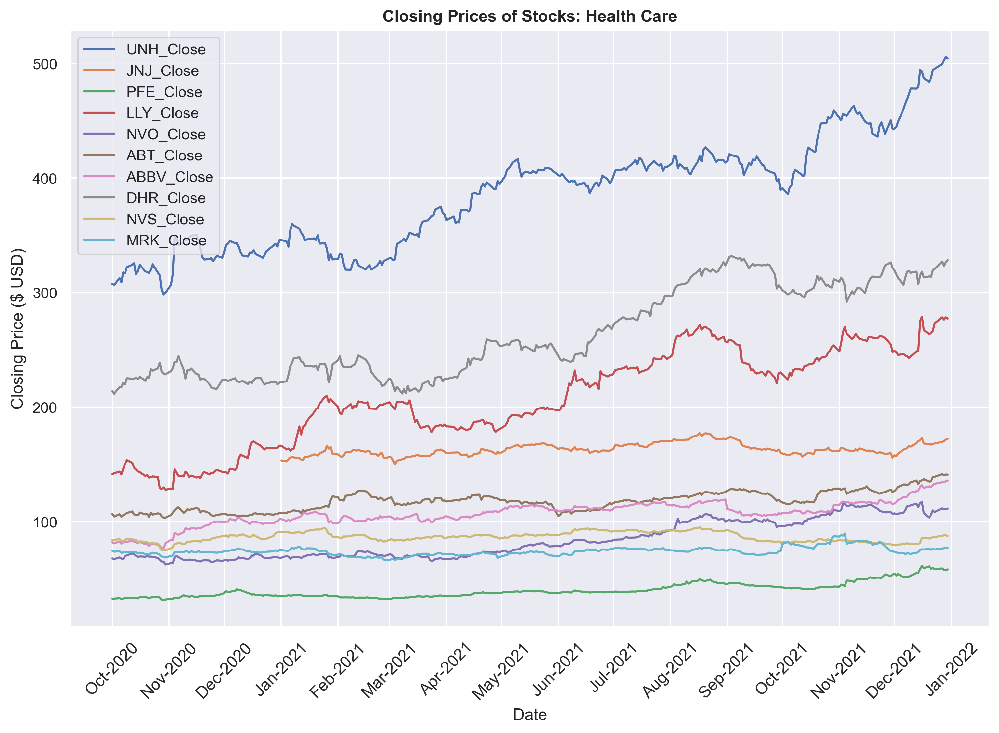

In [93]:
plot_prices(df_tickers, 'Health Care')

Finance


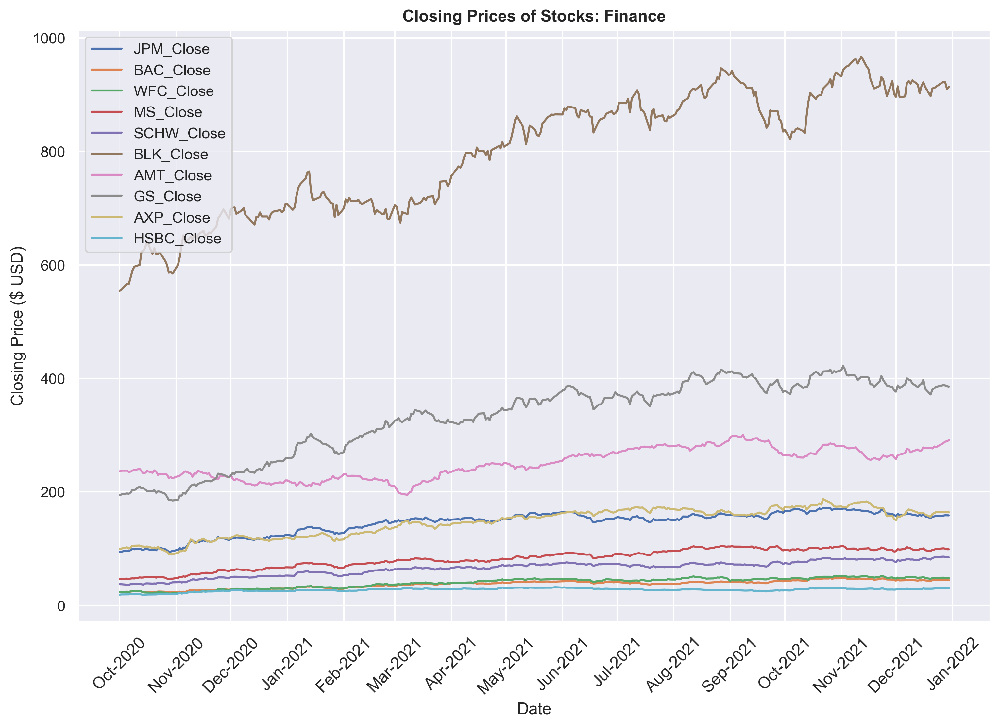

In [94]:
plot_prices(df_tickers, 'Finance')

Consumer Services


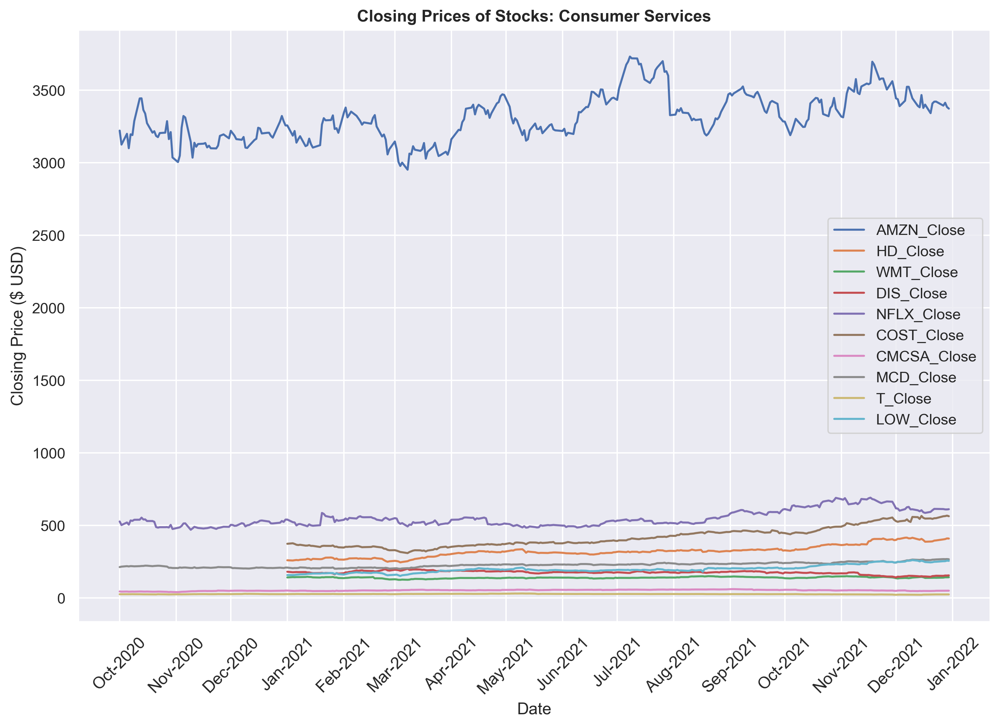

In [95]:
plot_prices(df_tickers, 'Consumer Services')

Technology


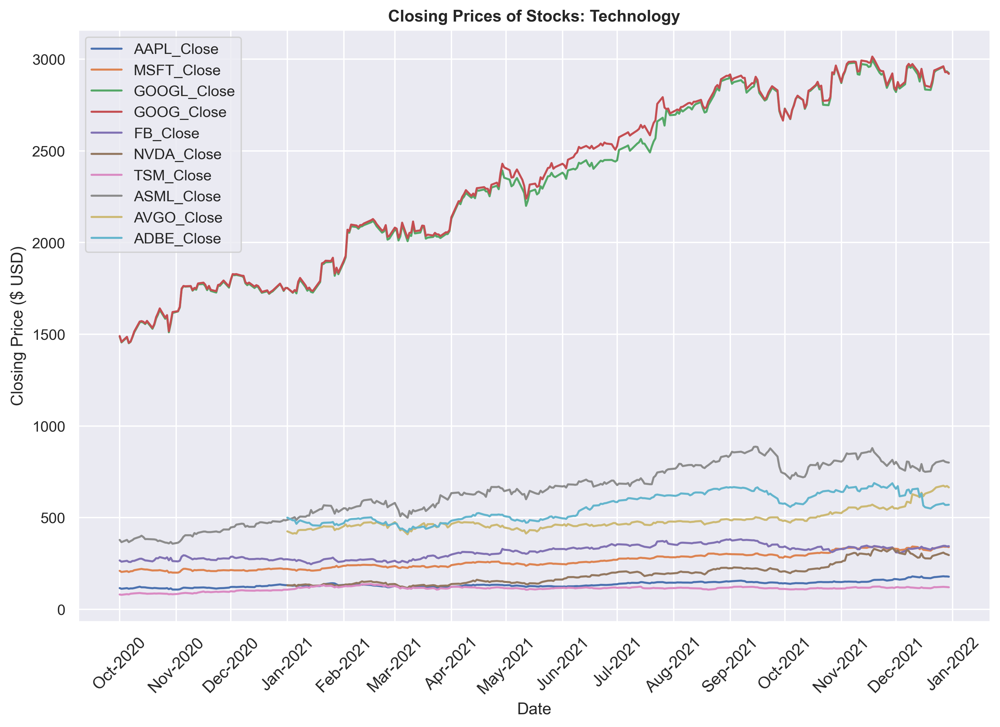

In [96]:
plot_prices(df_tickers, 'Technology')

Capital Goods


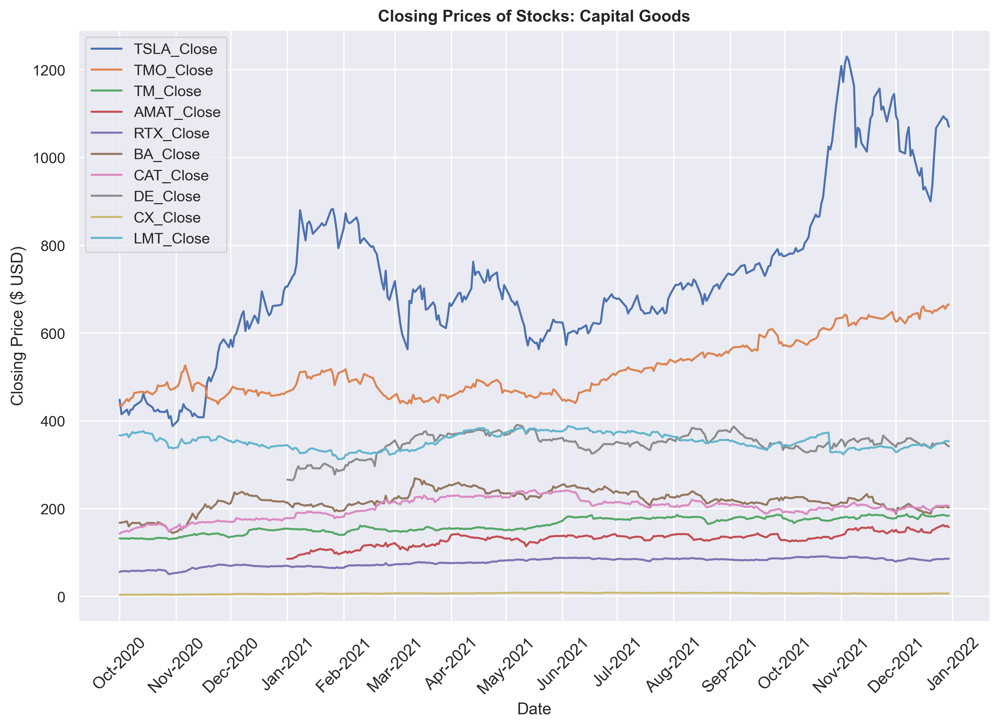

In [97]:
plot_prices(df_tickers, 'Capital Goods')

Basic Industries


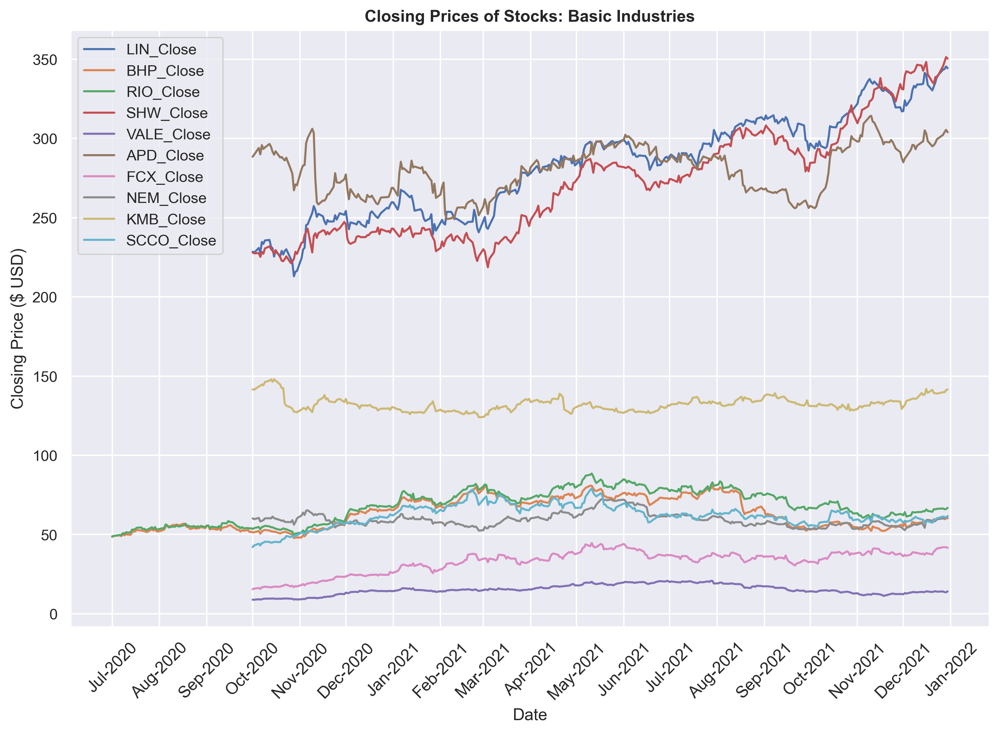

In [98]:
plot_prices(df_tickers, 'Basic Industries')

Energy


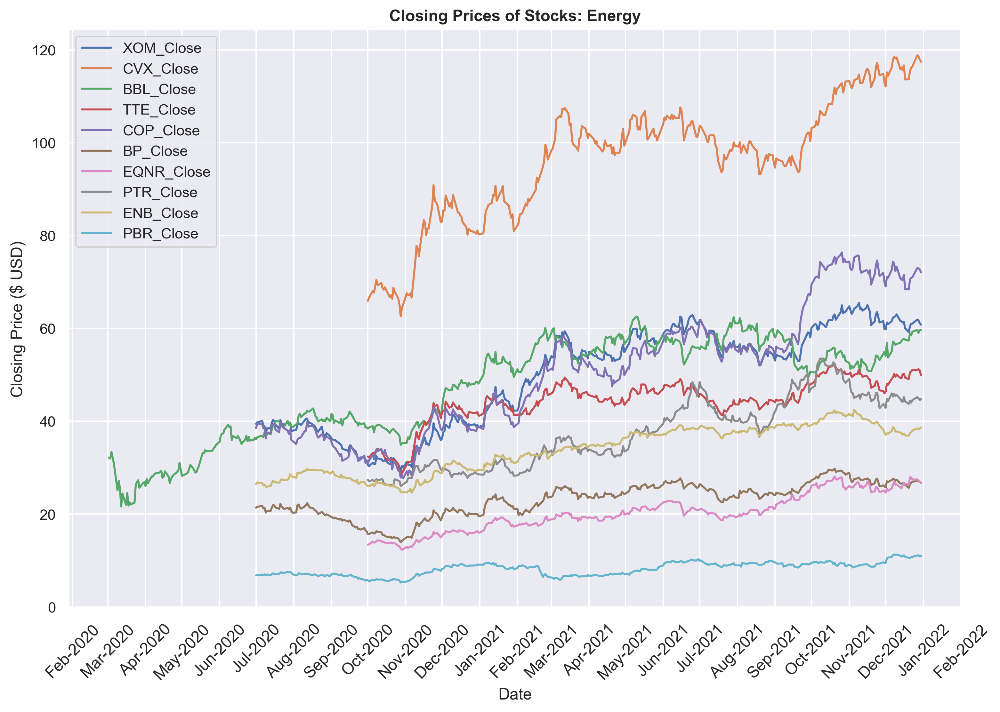

In [99]:
plot_prices(df_tickers, 'Energy')

Consumer Durables


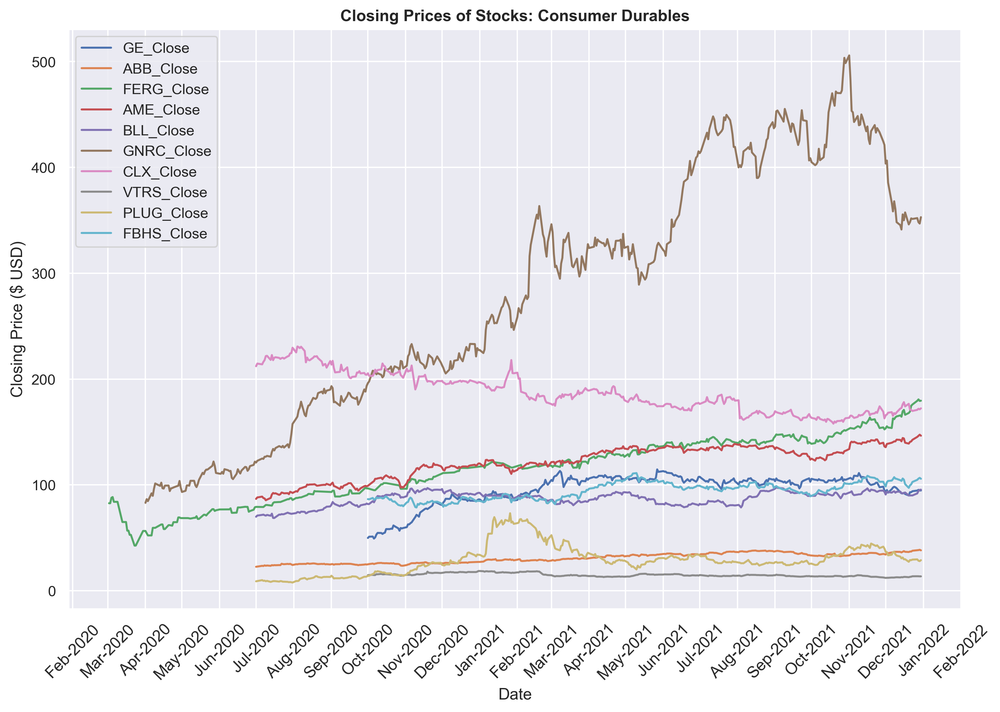

In [100]:
plot_prices(df_tickers, 'Consumer Durables')

Consumer Non-Durables


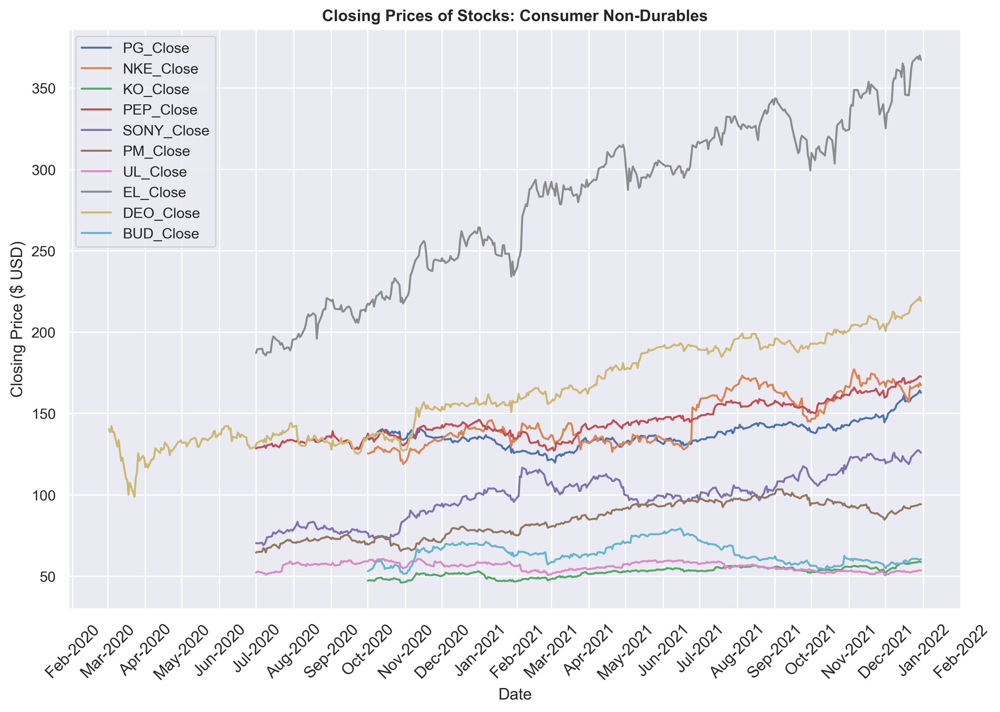

In [101]:
plot_prices(df_tickers, 'Consumer Non-Durables')

Public Utilities


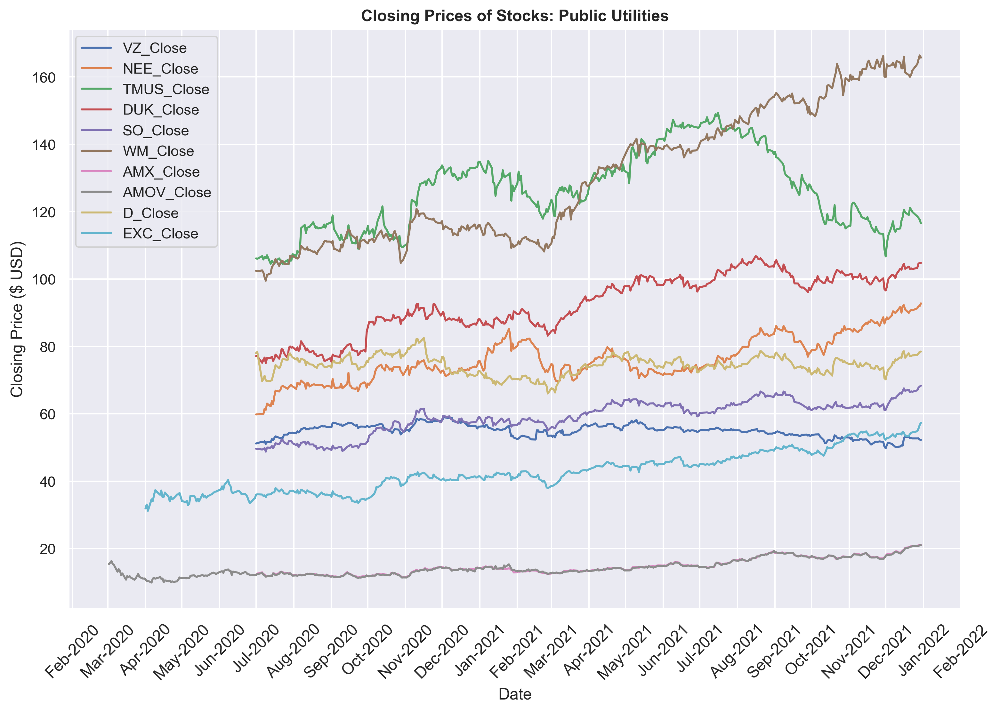

In [102]:
plot_prices(df_tickers, 'Public Utilities')

Transportation


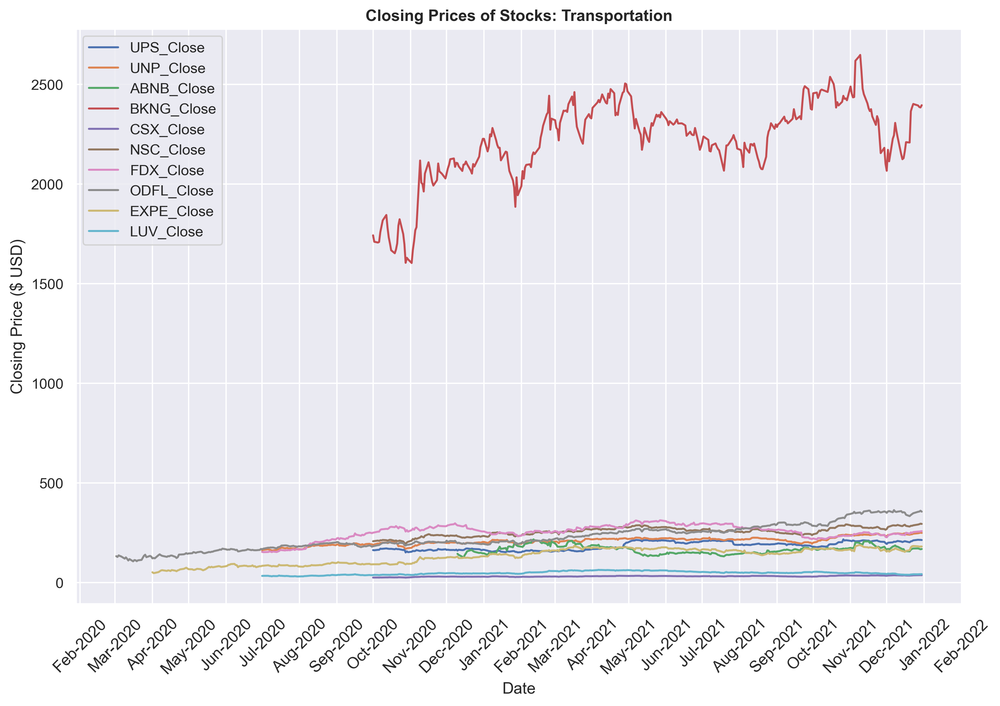

In [103]:
plot_prices(df_tickers, 'Transportation')

Miscellaneous


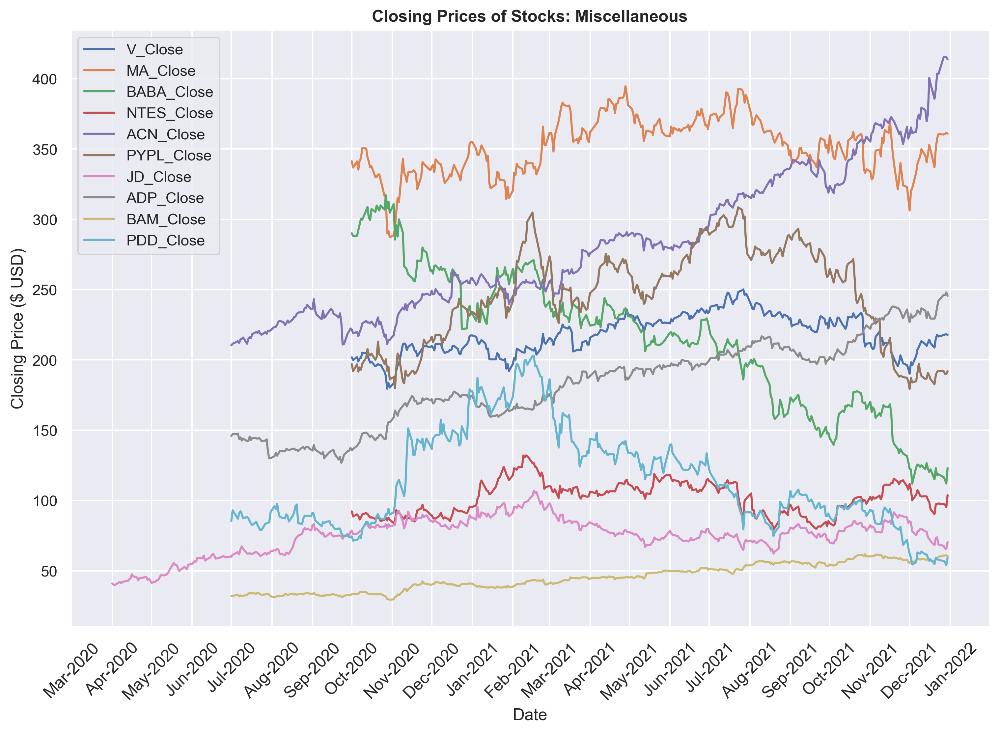

In [104]:
plot_prices(df_tickers, 'Miscellaneous')

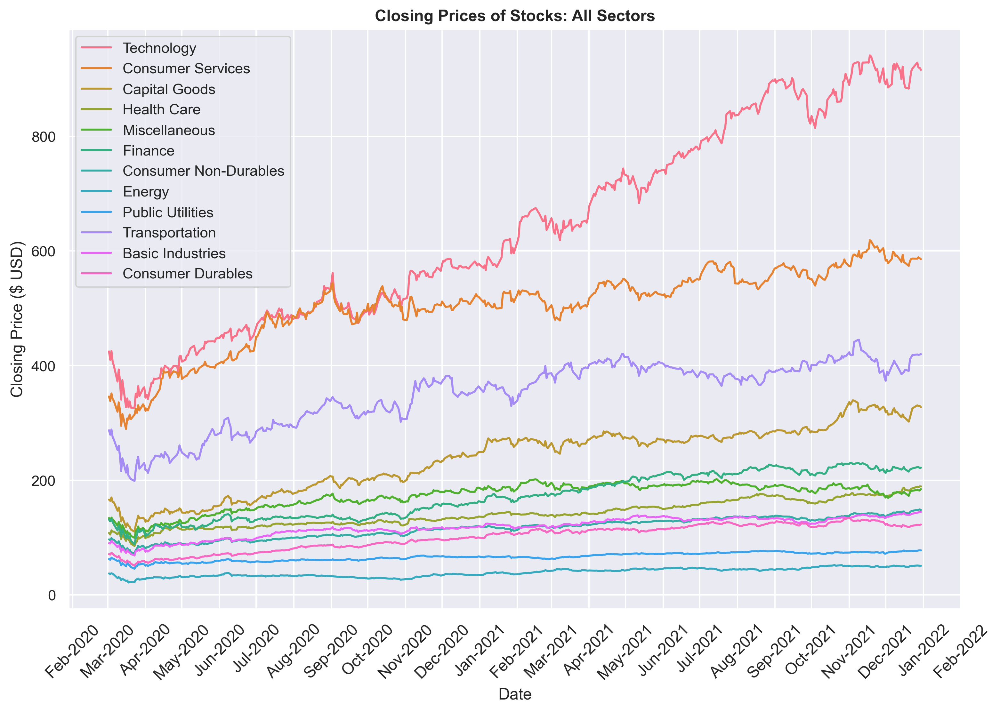

In [105]:
plot_sector_prices(df_sector)  

### 3.5. Stock Clustering During COVID-19

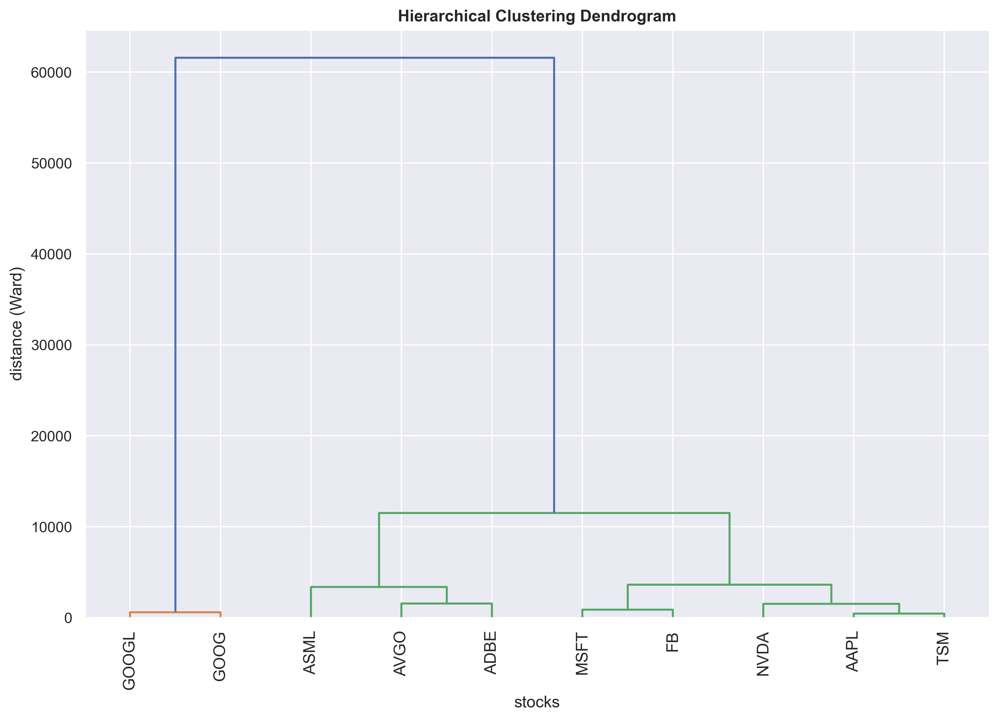

In [107]:
# create clustering function, percent change columns of closing price
def plot_cluster_sector(df_tickers, sector):
    
    # get top 10 tickers for sector, process, and filter columns for closing prices
    tickers = top_tickers_sector(df_tickers, sector)
    df = stock_preprocess(tickers)
    cols = df.columns[df.columns.str.contains(pat = 'Close')] 
    df = df[cols]
    df = df.rename(columns=lambda x: x.replace('_Close', ''))
    
    # fill in sentiment results
    df = df.replace(0,)
    df = df.interpolate('linear')
    df = df.dropna()
    
    # transpose news orgs and dates
    df = df.transpose()
 
    # create labels
    labels = list(df.index)

    # create linkages
    Z = linkage(df, 'ward')

    # make the dendrogram
    sns.set()
    fig, ax = plt.subplots(figsize = (12,8), dpi=300)  
    plt.title('Hierarchical Clustering Dendrogram', fontweight = 'bold')
    plt.xlabel('stocks')
    plt.ylabel('distance (Ward)')
    dendrogram(Z, labels=df.index, leaf_rotation=90)
    plt.show() 
    
_ = plot_cluster_sector(df_tickers, sector = ['Technology'])

### 3.6. Financial News Sentiment By Source 

In [108]:
def plot_sentiment(df):
    
    # get top 10 tickers for sector, process, and filter columns for closing prices
    cols = df.columns[df.columns.str.contains(pat = '_sentiment')] 
    df = df[cols]
    df = df.rename(columns=lambda x: x.replace('_sentiment', ''))
    
    # fill in sentiment results
    df = df.replace(0,)
    df = df.interpolate('linear')
    df = df.dropna()
    df = df.resample('M').mean()
    
    # set seaborn style, plot options and plot closing prices
    sns.set()
    fig, ax = plt.subplots(figsize = (12,8), dpi=300)
    sns.lineplot(data=df, dashes=False)
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
    plt.xticks(rotation=45, fontsize=12) 
    ax.set_title('Financial News Sentiment', fontweight ='bold')
    ax.set_xlabel('Date')
    ax.set_ylabel('Sentiment (-1 = Neg., +1 = Pos.)')
    plt.show()
    
    # print highest sentiment to lowest sentiment news sources
    print('Average News Sentiment by Source: \n\n{}'.format(df.mean().sort_values(ascending=False)))

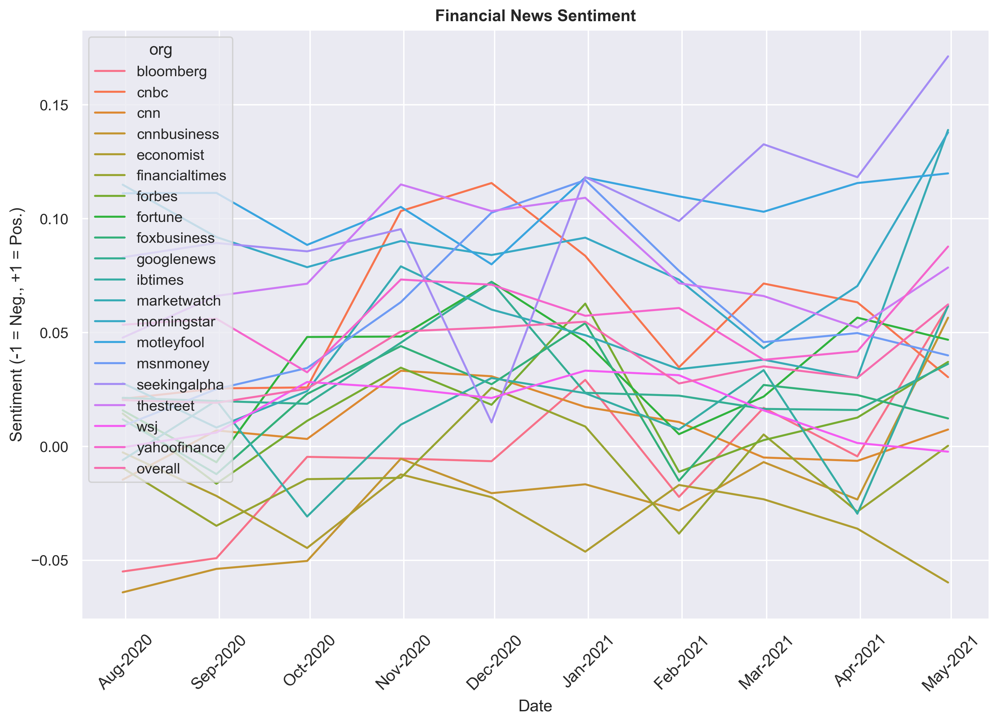

Average News Sentiment by Source: 

org
motleyfool        0.106263
seekingalpha      0.100340
morningstar       0.087613
thestreet         0.078123
cnbc              0.057487
yahoofinance      0.057200
msnmoney          0.056412
marketwatch       0.048931
overall           0.037741
fortune           0.035399
googlenews        0.029215
foxbusiness       0.019494
forbes            0.016610
wsj               0.016028
ibtimes           0.011933
cnn               0.008382
bloomberg        -0.003945
financialtimes   -0.009959
cnnbusiness      -0.021269
economist        -0.028595
dtype: float64


In [109]:
plot_sentiment(df_news)

### 3.7. Stock Correlation to Financial News Sentiment

In [110]:
# merge news dataframe overall sentiment with df_all dataframe
df_all = pd.merge(df_all, df_news[['overall_sentiment']], left_index=True, right_index=True, how='outer')

# filter for weekdays when stock price changes
df_all['day_of_week'] = df_all.index.dayofweek
df_all = df_all[(df_all['day_of_week'] >= 0) & (df_all['day_of_week'] <= 4)]

# print correlation values to determine stocks most correlated with news sentiment
correlation_mat = df_all.corr()
corr_pairs = correlation_mat.unstack()


In [113]:
print('Stocks with highest positive correlation to news sentiment: \n\n{}'.format(corr_pairs['overall_sentiment'].sort_values(kind="quicksort", ascending=False).iloc[:10]))

Stocks with highest positive correlation to news sentiment: 

overall_sentiment    1.000000
VZIO_C               0.865994
CPNG_C               0.533300
BLL_C                0.424698
OSCR_C               0.417866
COST_C               0.403847
UPS_C                0.361912
SGEN_C               0.347145
CL_C                 0.346785
BEKE_C               0.343463
dtype: float64


In [114]:
print('Stocks with highest negative correlation to news sentiment: \n\n{}'.format(corr_pairs['overall_sentiment'].sort_values(kind="quicksort", ascending=True).iloc[:10]))

Stocks with highest negative correlation to news sentiment: 

KR_C     -0.300398
NEM_C    -0.288484
IFF_C    -0.275439
MICT_C   -0.265419
AMT_C    -0.249610
TRP_C    -0.231424
YALA_C   -0.230880
NOC_C    -0.208004
NOK_C    -0.206681
SWBI_C   -0.203820
dtype: float64


### 3.8. Industry/Sector Correlation to Financial News Sentiment

In [116]:
df_sector_industry = pd.concat([df_sector.reset_index(), df_industry], axis=1)
df_sector_industry = df_sector_industry.rename(columns={"index": "Date"})
df_sector_industry = df_sector_industry.set_index('Date')
df_sector_industry.tail()

,Technology,Consumer Services,Capital Goods,Health Care,Miscellaneous,Finance,Consumer Non-Durables,Energy,Public Utilities,Transportation,...,Textiles,Soft Drinks,Transportation Services,Ordnance And Accessories,Tobacco,Other Metals and Minerals,Multi-Sector Companies,Miscellaneous manufacturing industries,EDP Peripherals,Computer Communications Equipment
Date,,,,,,,,,,,,,,,,,,,,,
2021-12-23,918.030012,586.696017,325.416934,185.909174,181.731997,220.626997,146.721000,50.598040,76.800000,418.349000,...,48.645000,17.469999,46.929998,18.695000,42.860001,45.106668,13.713334,7.65,0.920,2.87
2021-12-27,928.390994,586.481984,330.628465,188.565743,183.107998,222.862003,148.362999,51.307141,77.043000,419.383000,...,49.180002,17.620001,47.289998,18.705000,43.263334,45.760001,13.740000,7.44,0.837,2.90
2021-12-28,919.786995,589.000001,329.620764,188.154000,182.497001,222.970999,148.301998,51.142833,77.549001,418.740993,...,49.454999,17.660000,47.389998,18.580000,43.390001,45.906669,13.850000,7.68,0.830,2.80
2021-12-29,919.276016,587.204001,329.602991,189.249000,182.076001,221.417999,149.162999,50.959200,77.825001,419.250993,...,49.065000,17.719999,47.940001,18.360001,43.416667,45.123332,13.950000,7.89,0.790,2.78
2021-12-30,915.805005,585.689989,327.485997,189.383998,184.724997,221.914002,148.253000,50.786000,77.834999,419.920991,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


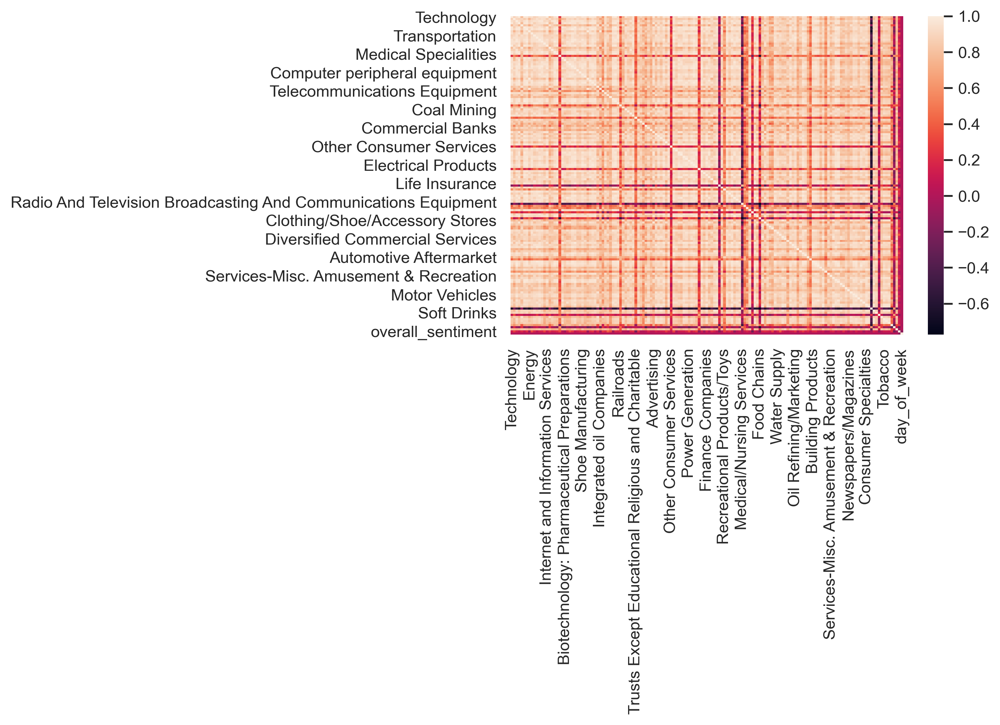

In [117]:
# merge news dataframe overall sentiment with df_all dataframe
df_all_2 = pd.merge(df_sector_industry, df_news[['overall_sentiment']], left_index=True, right_index=True, how='outer')

# filter for weekdays when stock price changes
df_all_2['day_of_week'] = df_all_2.index.dayofweek
df_all_2 = df_all_2[(df_all_2['day_of_week'] >= 0) & (df_all_2['day_of_week'] <= 4)]

# plot correlation heatmap across all stocks to view correlation
plt.figure(dpi=300)
sns.heatmap(df_all_2.corr()) 

# print correlation values to determine stocks most correlated with news sentiment
correlation_mat = df_all_2.corr()
corr_pairs = correlation_mat.unstack()


In [122]:
print('Industries/Sectors with highest positive correlation to news sentiment: \n\n{}'.format(corr_pairs['overall_sentiment'].sort_values(kind="quicksort", ascending=False).iloc[:10]))

Industries/Sectors with highest positive correlation to news sentiment: 

overall_sentiment                          1.000000
Air Freight/Delivery Services              0.402737
Containers/Packaging                       0.378378
Department/Specialty Retail Stores         0.345673
Power Generation                           0.325236
Public Utilities                           0.324264
Business Services                          0.319918
Electric Utilities: Central                0.306065
Computer Software: Prepackaged Software    0.299784
Real Estate                                0.295796
dtype: float64


In [123]:
print('Industries/Sectors with highest negative correlation to news sentiment: \n\n{}'.format(corr_pairs['overall_sentiment'].sort_values(kind="quicksort", ascending=True).iloc[:10]))

Industries/Sectors with highest negative correlation to news sentiment: 

Retail: Computer Software & Peripheral Equipment     -0.300233
EDP Peripherals                                      -0.265419
Trusts Except Educational Religious and Charitable   -0.233877
Food Chains                                          -0.203964
Computer Software: Programming Data Processing       -0.184617
Transportation Services                              -0.152610
day_of_week                                          -0.141564
Specialty Chemicals                                  -0.134947
Other Specialty Stores                               -0.133845
Oil & Gas Production                                 -0.083405
dtype: float64


## 4. Stock Screener Data Pipeline

### 4.0 Summary

As a seperate effort within this project, a data pipeline was created to automate an ETL process for picking undervalued stocks. The steps of this ETL pipeline include:
- create a database for stock tickers and financials
- extract, transform, and load stock tickers and financials to MySQL tables
- query stocks table to get the most undervalued stocks, sorted by market cap
- email a table of these stock picks

The below Directed Acyclic Graph (DAG) displays the dependencies of files and their name:

### 4.1 Dockerfile and Docker Compose

### 4.2 Stocks DAG

### 4.3 SQLConnect Class

### 4.4 Create Database

### 4.5 Extract Tickers & Financials

### 4.6 Transform, Load Tickers & Financials to MySQL

### 4.7 Query Stocks

### 4.8 Email Results

## 5. Conclusion

This project performed data analysis on stocks and scraped news headlines and tried to answer the following questions. The answers and results are shown below:


### **Which stocks have the greatest rate of return before vs. during COVID-19?** 

The stocks with the highest returns include the following:

| ticker | pandemic_change% 
| :- | :-: 
| TSLA | 589.309 | 
| CVNA | 477.913 |  
| PDD | 290.054 | 
| GNRC | 282.471 | 
| MELI | 232.365 | 
| DE | 178.419 | 
| SCCO | 167.482 | 
| FDX | 162.865 | 
| ASML | 162.79 | 
| KMX | 153.724 | 

### **Which sectors have the greatest rate of return before vs. during COVID-19?**

The sectors with the highest returns include the following:

| sector | pandemic_change% 
| :- | :-: 
| Consumer Durables | 103.636663 | 
| Miscellaneous | 101.987157 |  
| Capital Goods | 99.840312 | 
| Technology | 95.468499 | 
| Transportation | 88.925665 | 
| Finance | 85.931560 | 
| Basic Industries | 57.395231 | 
| Consumer Services | 57.371112 | 
| Consumer Non-Durables | 50.414571 | 
| Energy | 46.359885 | 
| Public Utilities | 37.793667 | 
| Health Care | 36.989555 | 

### **Which industries have the greatest rate of return before vs. during COVID-19?**

The industries with the highest returns include the following:

| industry | pandemic_change% 
| :- | :-: 
| Auto Manufacturing | 304.387023 | 
| Engineering & Construction | 156.161482 |  
| Shoe Manufacturing | 127.565042 | 
| Restaurants | 111.543056 | 
| Semiconductors | 103.183557 | 
 
### **How have sector stock prices changed over time during COVID-19?**

The changes in price for all stock sectors is plotted in section 3.4 stock sector prices over time. All sectors show a positive return, with some sectors showing higher growth (e.g. Technology) than others (e.g. Health Care). See section 3.4 for the stock price changes for the leading stocks in each sector. 

### **Can stock price changes be used to cluster groups of individual stocks?**

In section 3.5 stock clustering during COVID-19, a dendogram was plotted for a sample of stocks (the top 10 stocks in Technology sector). The heirarichical clustering dendogram showed the clustering of stock prices in terms of euclidean distance, based on the ward method (minimize variance within each cluster). The results show the strongest clustering between Google (GOOG and GOOGL, obviously), Microsoft and Salesforce (MSFT and CRM), Adobe and Nvidia (ADBE and NVDA), and Apple and Intel (AAPL and INTC). 

### **Which financial news sources have the highest/lowest headline sentiment?**

In section 3.6 financial news sentiment by source, the various scraped news headlines strings were converted to sentiment and resampled daily over time. The most positive news sentiment was found to be Motley Fool, Seeking Alpha and Morninstar. The most negative news sentiment was found to be Economist, CNN Business, and Financial Times. 

### **Which stocks are correlated to financial news sentiment?**

In section 3.7 stock correlation to financial news sentiment, the correlation between stock prices and news sentiment was analyzed. The stocks with the strongest positive correlation to news sentiment, in terms of pearson correlation coefficient, was found to be Fedex (0.422833), Ball Corporation (0.422745), Copart (0.399580), Costco (0.399254), and United Parcel Service (0.353451).  

### **Which sectors/industries are correlated to financial news sentiment?**

In section 3.8 sector/industry correlation to financial news sentiment, the correlation between sectors/industries and news sentiment was analyzed. The sectors/industries with the strongest positive correlation to news sentiment, in terms of pearson correlation coefficient, was found to be Department/Specialty Retail Stores (0.396246), Apparel (0.371543), Air Freight/Delivery Services (0.336459), and Containers/Packaging (0.331440). A correlation heatmap was also plotted to visually show the results. 

### **Can we screen stocks that are good value based on average sector Price/Earnings ratio, and quarterly growth percent?**

In section 3.9, a stock screener based on Price/Earnings ratio (trailing P/E), and quarterly earnings was created, in order to find stocks that are a good value to invest. The screener filtered the top 50 stocks by market cap. The first criteria in filtering stocks was finding stocks with a Price/Earnings ratio that was lower than the average Price/Earnings ratio in that stock's sector. The second criteria was finding stocks with quarterly growth of at least 5% in each of the last four quarters. The resulting stocks that matched this criteria include Facebook, JP Morgan and Chase, Toyota, and Thermo Fisher Scientific. In future work, the screener can be easily adjusted to screen based on other criteria such as yearly earnings, higher earnings growth (e.g. 10% quarter over quarter/year over year), and other metrics. 